### CNN: Convolution Neural Network(CNN)
### CNN study the image and extract it's feature and rather than  passing complete information to the ANN it's pass feature of images

### IMAGE CLASSIFICATION PROJECT

In [1]:
import numpy as np
import pandas as pd
import os
import cv2    # open cv
from PIL import Image
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import matplotlib.pyplot as plt

In [2]:
# images -: collection of pixels(0-255)
# binary images : pixels(0/1)  -> 0-> white , 1 -> black
# grayscale images : 0-> black ; 127.5 :gray ; 255: white
# rgb images : red ; green ; blue (255,255,255) 
# red : (255,0,0 ) ; green (0,255,0) ; blue: (0,0,255)
# rgb(125,200,150)--> form different color

In [3]:
cat_imag_Demo_File_path =r"C:\Users\hp\Downloads\Data-20240730T153251Z-001\Data\images\cats\cat_80.jpg"

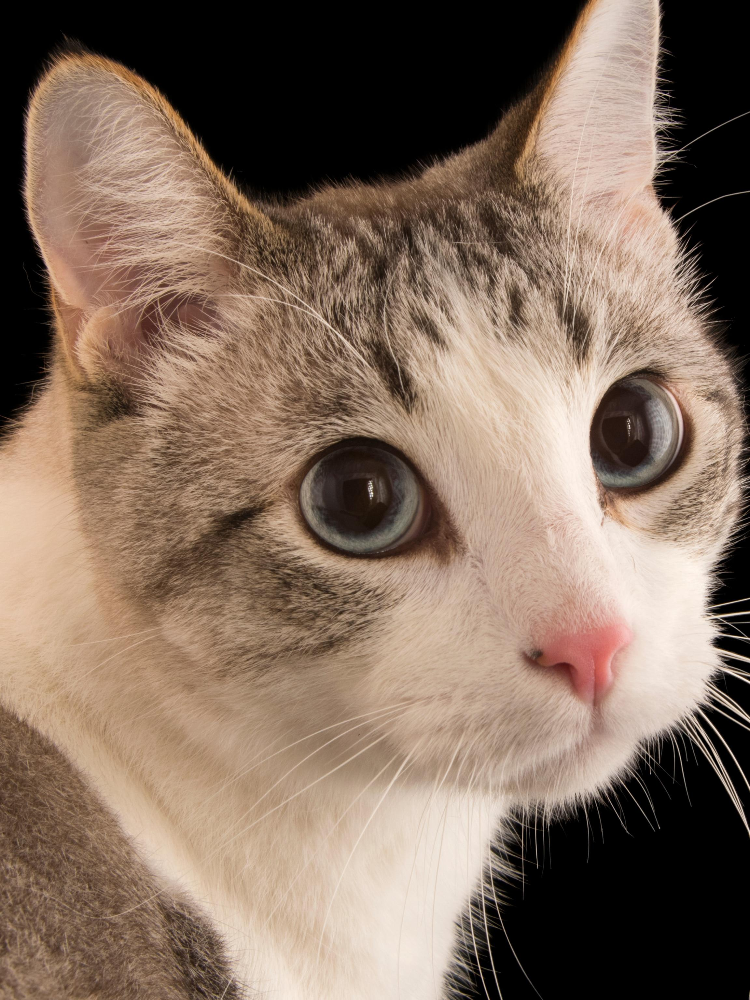

In [4]:
cat = Image.open(cat_imag_Demo_File_path)
cat

In [5]:
cat_image=np.array(cat)
cat_image

array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0]],

       ...,

       [[154, 124, 100],
        [152, 122,  98],
        [151, 121,  97],
        ...,
        [119, 113, 113],
        [120, 110, 109],
        [ 61,  51,  49]],

       [[152, 122,  98],
        [151, 121,  97],
        [149, 119,  95],
        ...,
        [114, 108, 108],
        [118, 108, 107],
        [ 62,  52,  51]],

       [[150, 120,  96],
        [149, 119,  95],
        [148, 118,  94],
        ...,
        [111, 105, 105],
        [116, 106, 105],
        [ 62,  52,  51]]

In [6]:
cat_image.shape

(3072, 2304, 3)

In [7]:
cd CNN


[WinError 2] The system cannot find the file specified: 'CNN'
c:\Users\hp\Desktop\CNN


C:\Users\hp\AppData\Roaming\Python\Python312\site-packages\IPython\core\magics\osm.py:393: UserWarning: This is now an optional IPython functionality, using bookmarks requires you to install the `pickleshare` library.
  bkms = self.shell.db.get('bookmarks', {})


In [8]:
path_dict = {'cats':[], 'dogs':[]}
images_path = r"c:\Users\hp\Downloads\Data-20240730T153251Z-001\Data\images"
for dire in os.listdir(images_path):
    directory_path = os.path.join(images_path, dire)  # data-> images -> cat
    for image_name in os.listdir(directory_path):
        path_dict[dire].append(os.path.join(directory_path,image_name))

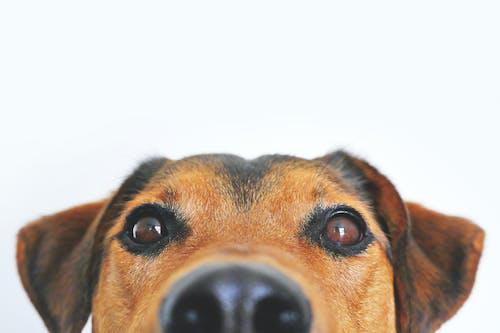

In [9]:
Image.open(path_dict['dogs'][11])

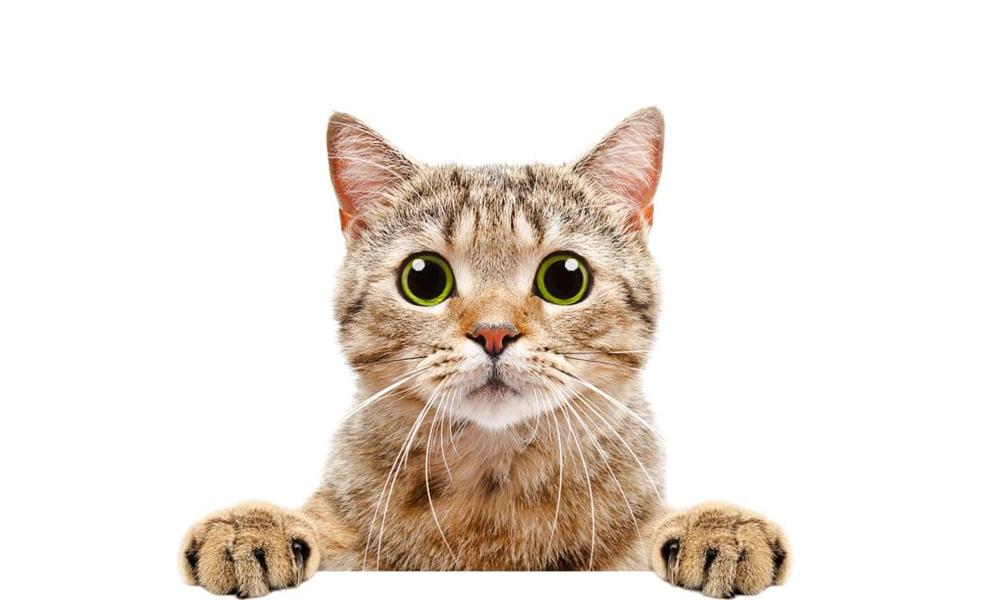

In [10]:
Image.open(path_dict['cats'][7])

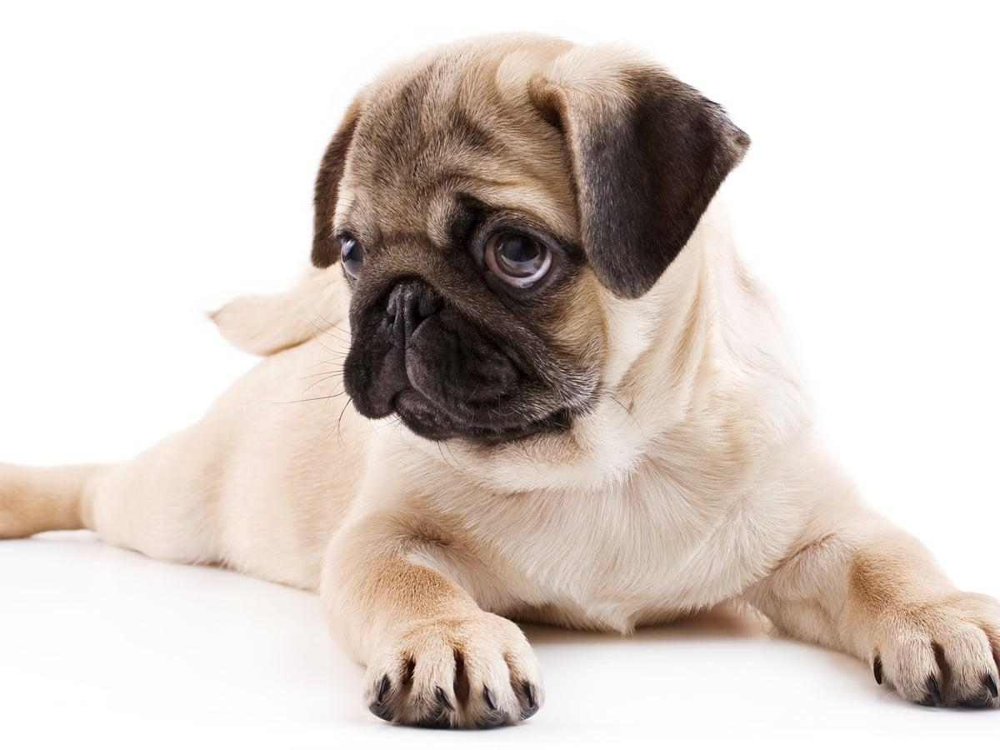

In [11]:
Image.open(path_dict['dogs'][16])

In [12]:
# we need to controlled size of all images 
# Image.open(path_dict['cats'][2])
cv2.imread(path_dict['cats'][2])
# x = []   # <=== CATS
# Y= []    # <==== DOGS

array([[[250, 240, 233],
        [250, 240, 233],
        [250, 240, 233],
        ...,
        [  9,  11,  12],
        [  9,  11,  11],
        [  9,  11,  11]],

       [[250, 240, 233],
        [250, 240, 233],
        [250, 240, 233],
        ...,
        [  9,  11,  12],
        [  9,  11,  11],
        [  9,  11,  11]],

       [[250, 240, 233],
        [250, 240, 233],
        [250, 240, 233],
        ...,
        [  9,  11,  12],
        [  9,  11,  11],
        [  9,  11,  11]],

       ...,

       [[121, 111, 124],
        [119, 109, 122],
        [116, 106, 119],
        ...,
        [ 25,  20,  21],
        [ 25,  20,  21],
        [ 25,  20,  21]],

       [[122, 112, 125],
        [119, 109, 122],
        [115, 105, 118],
        ...,
        [ 24,  19,  20],
        [ 24,  19,  20],
        [ 24,  19,  20]],

       [[123, 113, 126],
        [119, 109, 122],
        [114, 104, 117],
        ...,
        [ 23,  18,  19],
        [ 23,  18,  19],
        [ 23,  18,  19]]

In [13]:
cat_path = r"C:\Users\hp\Desktop\CNN\Data-20240730T153251Z-001\Data\images\cats"
dog_path = r"C:\Users\hp\Desktop\CNN\Data-20240730T153251Z-001\Data\images\dogs"
x = []   # For cats
y = []   # For dogs
def collect_image_paths(directory_path, image_list):
    for image_name in os.listdir(directory_path):
        full_image_path = os.path.join(directory_path, image_name)
        image_list.append(full_image_path)

In [14]:
path_dict

{'cats': ['c:\\Users\\hp\\Downloads\\Data-20240730T153251Z-001\\Data\\images\\cats\\cat_1.jpg',
  'c:\\Users\\hp\\Downloads\\Data-20240730T153251Z-001\\Data\\images\\cats\\cat_10.jpg',
  'c:\\Users\\hp\\Downloads\\Data-20240730T153251Z-001\\Data\\images\\cats\\cat_100.jpg',
  'c:\\Users\\hp\\Downloads\\Data-20240730T153251Z-001\\Data\\images\\cats\\cat_101.jpg',
  'c:\\Users\\hp\\Downloads\\Data-20240730T153251Z-001\\Data\\images\\cats\\cat_102.jpg',
  'c:\\Users\\hp\\Downloads\\Data-20240730T153251Z-001\\Data\\images\\cats\\cat_103.jpg',
  'c:\\Users\\hp\\Downloads\\Data-20240730T153251Z-001\\Data\\images\\cats\\cat_104.jpg',
  'c:\\Users\\hp\\Downloads\\Data-20240730T153251Z-001\\Data\\images\\cats\\cat_106.jpg',
  'c:\\Users\\hp\\Downloads\\Data-20240730T153251Z-001\\Data\\images\\cats\\cat_109.jpg',
  'c:\\Users\\hp\\Downloads\\Data-20240730T153251Z-001\\Data\\images\\cats\\cat_11.jpg',
  'c:\\Users\\hp\\Downloads\\Data-20240730T153251Z-001\\Data\\images\\cats\\cat_111.jpg',
  'c:\

In [15]:
# for resize the images in equal length (img in the form f numpy array)
# resize(,(size))
x=[]   # images 
y=[]   # name of image(label)
for key, ls_path in path_dict.items():
    for path in ls_path:
        img_arr=cv2.imread(path)
        resized_img=cv2.resize(img_arr,(224,224))
        x.append(resized_img)
        y.append(key)
       

In [16]:
len(x),len(y)

(697, 697)

In [17]:
for i in range(len(y)):
    if y[i]=="cats":
        y[i]=0
    else:
        y[i]=1
    

In [18]:
x=np.array(x)
y=np.array(y)

In [19]:
x  # 4d array

array([[[[156, 141,  92],
         [159, 144, 102],
         [159, 145, 112],
         ...,
         [152, 142,  75],
         [156, 144,  80],
         [160, 148,  84]],

        [[151, 136,  87],
         [155, 140,  97],
         [157, 143, 107],
         ...,
         [151, 140,  75],
         [154, 142,  77],
         [157, 145,  81]],

        [[150, 136,  86],
         [155, 141,  96],
         [155, 140, 102],
         ...,
         [151, 139,  75],
         [153, 141,  77],
         [157, 145,  81]],

        ...,

        [[ 81,  90,  99],
         [ 77,  86,  95],
         [ 79,  88,  97],
         ...,
         [ 37,  42,  60],
         [ 39,  42,  57],
         [ 40,  43,  58]],

        [[ 52,  59,  59],
         [ 54,  60,  61],
         [ 51,  57,  58],
         ...,
         [ 40,  44,  59],
         [ 42,  45,  60],
         [ 43,  46,  61]],

        [[ 37,  41,  36],
         [ 33,  37,  34],
         [ 35,  38,  35],
         ...,
         [ 40,  43,  56],
        

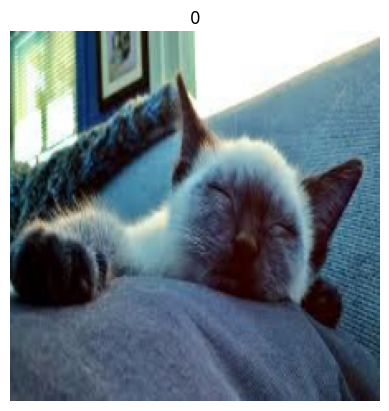

In [20]:
def img_render(position):
    plt.imshow(x[position])
    plt.title(y[position])
    plt.axis('off')  # remove axis
    plt.show()
# imshow--> image show ( it can understand the pixels value)
img_render(23)

In [21]:
# assignment---> plt.subplot() or print 10 images

In [22]:
#Normalizing the pixels value (range-> 0 to 255 become 0 to 1  for the epurpose of complexity or computational time)
X = x/255.0
X


array([[[[0.61176471, 0.55294118, 0.36078431],
         [0.62352941, 0.56470588, 0.4       ],
         [0.62352941, 0.56862745, 0.43921569],
         ...,
         [0.59607843, 0.55686275, 0.29411765],
         [0.61176471, 0.56470588, 0.31372549],
         [0.62745098, 0.58039216, 0.32941176]],

        [[0.59215686, 0.53333333, 0.34117647],
         [0.60784314, 0.54901961, 0.38039216],
         [0.61568627, 0.56078431, 0.41960784],
         ...,
         [0.59215686, 0.54901961, 0.29411765],
         [0.60392157, 0.55686275, 0.30196078],
         [0.61568627, 0.56862745, 0.31764706]],

        [[0.58823529, 0.53333333, 0.3372549 ],
         [0.60784314, 0.55294118, 0.37647059],
         [0.60784314, 0.54901961, 0.4       ],
         ...,
         [0.59215686, 0.54509804, 0.29411765],
         [0.6       , 0.55294118, 0.30196078],
         [0.61568627, 0.56862745, 0.31764706]],

        ...,

        [[0.31764706, 0.35294118, 0.38823529],
         [0.30196078, 0.3372549 , 0.37254902]

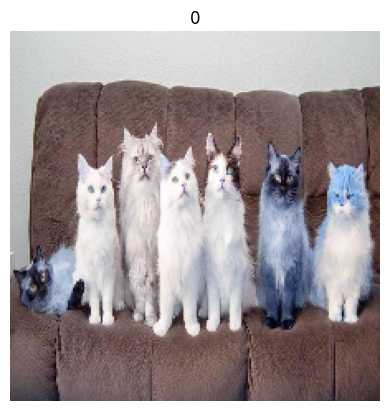

In [23]:
img_render(45)  # before  transformation ( range 0 to 255)

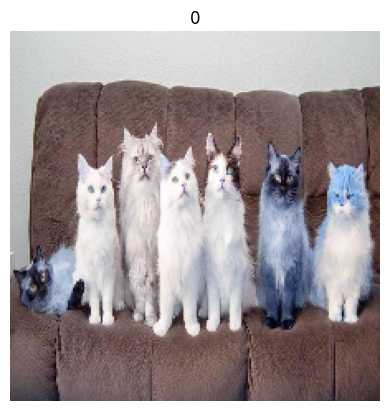

In [24]:
# after transformation ( range 0 to 1)
plt.imshow(x[45])
plt.title(y[45])
plt.axis('off')  # remove axis
plt.show()
# imshow--> image show ( it can understand the pixels value)


In [25]:
# training or testing

from sklearn.model_selection import train_test_split

In [26]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.15)

In [27]:
x_train[5].shape

(224, 224, 3)

In [34]:
### CNN  model define

model = Sequential([
    # Convolutional layers,  input_shape= imag_dimantion, filter_size of convolutional =(3,3)
    layers.Conv2D(64, (3,3), activation='relu', input_shape=(224, 224, 3)),
    # pooling layers
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(32, (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(15, (3,3), activation='relu'),

    #flattening layer (flatten function - convert 3d image or data to single dimentional)
    layers.Flatten(),

    # Dense layers for classification
    layers.Dense(20, activation='relu'),
    layers.Dense(13, activation='relu'),
    layers.Dense(10, activation='relu'),
    
    layers.Dense(1, activation='sigmoid')
])

# Compile the model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Print model summary for a detailed overview
model.summary()

# for rigth accuracy we can increase the hidden layers or we can increase the no. of neurons or by the kerastuner (from this we can findout the optimal no of hidden layers or no. of neuron )

c:\Users\hp\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 222, 222, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 111, 111, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 109, 109, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 54, 54, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 52, 52, 15)     │         4,335 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 40560)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 20)             │       811,220 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 13)             │           273 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 10)             │           140 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 836,235 (3.19 MB)

 Trainable params: 836,235 (3.19 MB)

 Non-trainable params: 0 (0.00 B)

In [35]:
logs = model.fit(x_train,y_train,epochs=8,validation_data=(x_test,y_test))

Epoch 1/8
19/19 ━━━━━━━━━━━━━━━━━━━━ 32s 1s/step - accuracy: 0.5118 - loss: 12.0604 - val_accuracy: 0.6095 - val_loss: 0.6703
Epoch 2/8
19/19 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.7058 - loss: 0.5789 - val_accuracy: 0.5524 - val_loss: 1.0093
Epoch 3/8
19/19 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.7551 - loss: 0.5645 - val_accuracy: 0.5048 - val_loss: 0.6881
Epoch 4/8
19/19 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.8761 - loss: 0.3320 - val_accuracy: 0.5905 - val_loss: 0.7301
Epoch 5/8
19/19 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.9162 - loss: 0.2180 - val_accuracy: 0.5905 - val_loss: 0.9164
Epoch 6/8
19/19 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step - accuracy: 0.9631 - loss: 0.1309 - val_accuracy: 0.6190 - val_loss: 1.3246
Epoch 7/8
19/19 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.9711 - loss: 0.0516 - val_accuracy: 0.6571 - val_loss: 1.5622
Epoch 8/8
19/19 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.9968 - loss: 0.0214 - val_accuracy: 0.6000 - val_loss: 1.7562

In [30]:
df=pd.DataFrame(logs.history)
df

,accuracy,loss,val_accuracy,val_loss
0,0.520270,25.620604,0.504762,1.007067
1,0.500000,0.832423,0.495238,0.691055
2,0.581081,0.683155,0.571429,0.691162
3,0.689189,0.627745,0.533333,0.691534
4,0.743243,0.539113,0.600000,0.834201
5,0.819257,0.393329,0.628571,0.816205
6,0.917230,0.249806,0.523810,1.272456
7,0.927365,0.187189,0.561905,0.990026


<Axes: >

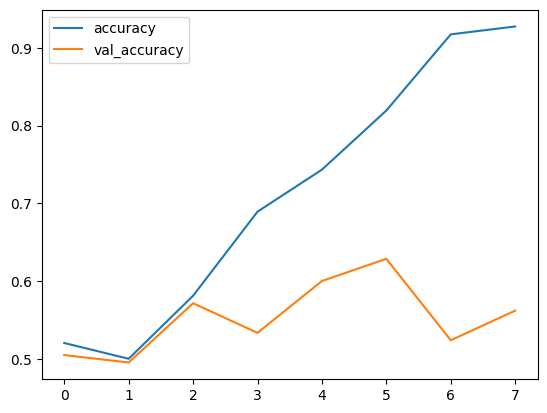

In [31]:
df[['accuracy','val_accuracy']].plot() # x-->epoch,y-->accuracy


In [32]:
### PREDICTION
print(model.evaluate(x_train,y_train))
print(model.evaluate(x_test,y_test))


19/19 ━━━━━━━━━━━━━━━━━━━━ 4s 223ms/step - accuracy: 0.9691 - loss: 0.1624
[0.16990992426872253, 0.9662162065505981]
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 173ms/step - accuracy: 0.5706 - loss: 1.0094
[0.9900257587432861, 0.561904788017273]


In [33]:
# confusion matrix, report or save the model
# image classification on mnist dataset


In [36]:
from sklearn.metrics import confusion_matrix,classification_report

In [45]:
y_train_pred_prob = model.predict(x_train)
y_test_pred_prob = model.predict(x_test)

19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 239ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step


In [52]:

y_test_pred = (y_test_pred_prob > 0.5).astype(int)
y_train_pred = (y_train_pred_prob > 0.5).astype(int)

In [54]:
y_test_pred.shape

(105, 1)

In [56]:
y_test.shape

(105,)